# **4.1 Fase Carga y Preparación Datos**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import zipfile
import torch
import torchvision
from torchvision.datasets import ImageFolder
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader

# Ruta del archivo zip (ajusta esta ruta según sea necesario)
zip_file = '/content/drive/MyDrive/newarchive.zip'
extract_dir = '/content'

# Extraer el archivo zip
with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# Directorio de datos (ajusta esta ruta según sea necesario)
data_dir = '/content/garbage_classification'

# Transformaciones
transformations = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

# Cargar dataset
dataset = ImageFolder(data_dir, transform=transformations)

# Determinar tamaños de los conjuntos de datos
num_train = int(0.7 * len(dataset))
num_val = int(0.1 * len(dataset))
num_test = len(dataset) - num_train - num_val

# Dividir el dataset
train_ds, val_ds, test_ds = random_split(dataset, [num_train, num_val, num_test])

# Crear DataLoader
batch_size = 32
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_dl = DataLoader(val_ds, batch_size*2, num_workers=4, pin_memory=True)
test_dl = DataLoader(test_ds, batch_size*2, num_workers=4, pin_memory=True)

# Verificar el número de imágenes en cada conjunto de datos
print(f'Tamaño del conjunto de entrenamiento: {len(train_ds)}')
print(f'Tamaño del conjunto de validación: {len(val_ds)}')
print(f'Tamaño del conjunto de prueba: {len(test_ds)}')


Tamaño del conjunto de entrenamiento: 10860
Tamaño del conjunto de validación: 1551
Tamaño del conjunto de prueba: 3104


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# **4.2 Fase Modelado Res-Net50**

In [ ]:
#### Paso 2: Definir el Modelo
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F

def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

class ImageClassificationBase(nn.Module):
    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print(f"Epoch {epoch+1}: train_loss: {result['train_loss']:.4f}, val_loss: {result['val_loss']:.4f}, val_acc: {result['val_acc']:.4f}")

class ResNet(ImageClassificationBase):
    def __init__(self):
        super().__init__()
        self.network = models.resnet50(pretrained=True)
        num_ftrs = self.network.fc.in_features
        self.network.fc = nn.Linear(num_ftrs, len(dataset.classes))

    def forward(self, xb):
        return self.network(xb)


# **4.3 Fase Prediccion Nuevos Samples Analisis Resultados**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 134MB/s]


Epoch 1: train_loss: 0.3769, val_loss: 0.1374, val_acc: 0.9567
Epoch 2: train_loss: 0.0808, val_loss: 0.1102, val_acc: 0.9706
Epoch 3: train_loss: 0.0422, val_loss: 0.0980, val_acc: 0.9731
Epoch 4: train_loss: 0.0370, val_loss: 0.1108, val_acc: 0.9711
Epoch 5: train_loss: 0.0294, val_loss: 0.0858, val_acc: 0.9756
Epoch 6: train_loss: 0.0343, val_loss: 0.1051, val_acc: 0.9730
Epoch 7: train_loss: 0.0185, val_loss: 0.1216, val_acc: 0.9673
Epoch 8: train_loss: 0.0264, val_loss: 0.1119, val_acc: 0.9748
Modelo guardado en resnet50_garbage_classification.pth


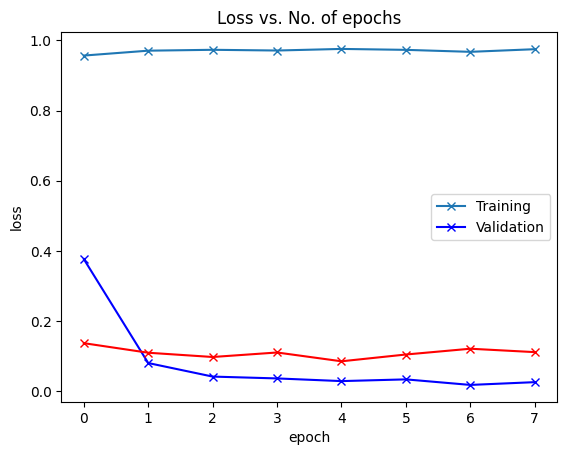

In [ ]:
# Mover modelo a dispositivo GPU si está disponible
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

device = get_default_device()
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
test_dl = DeviceDataLoader(test_dl, device)

model = ResNet()
model = to_device(model, device)

@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD):
    history = []
    optimizer = opt_func(model.parameters(), lr)
    for epoch in range(epochs):
        model.train()
        train_losses = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history

# Configuración de hiperparámetros y entrenamiento
num_epochs = 8
opt_func = torch.optim.Adam
lr = 5.5e-5

history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)

# Guardar el modelo entrenado
model_path = "resnet50_garbage_classification.pth"
torch.save(model.state_dict(), model_path)
print(f"Modelo guardado en {model_path}")

# Graficar precisión y pérdida
import matplotlib.pyplot as plt

def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs')

plot_accuracies(history)

def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')

plot_losses(history)


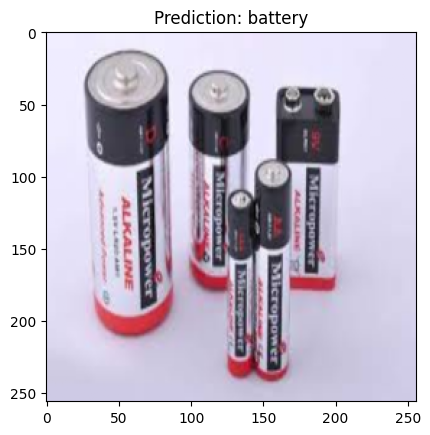

The image /content/garbage_classification/battery/battery30.jpg resembles battery.


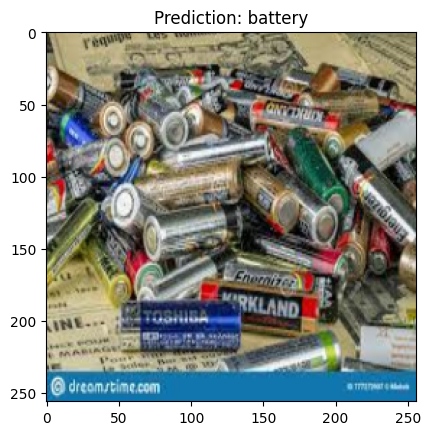

The image /content/garbage_classification/battery/battery803.jpg resembles battery.


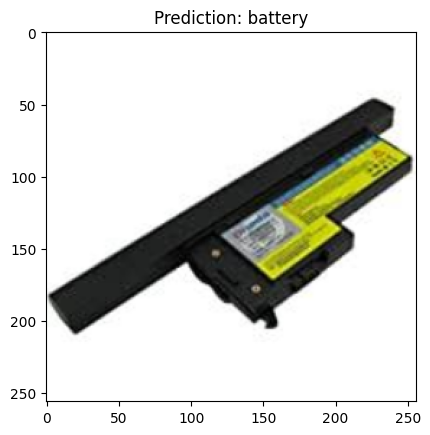

The image /content/garbage_classification/battery/battery270.jpg resembles battery.


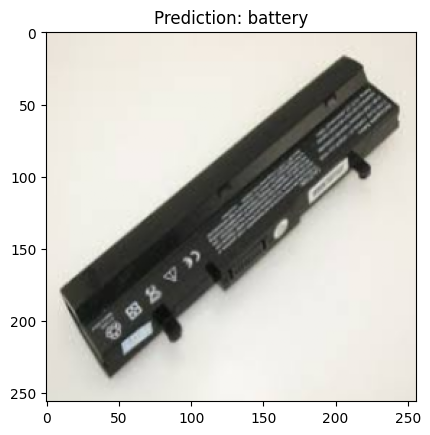

The image /content/garbage_classification/battery/battery493.jpg resembles battery.


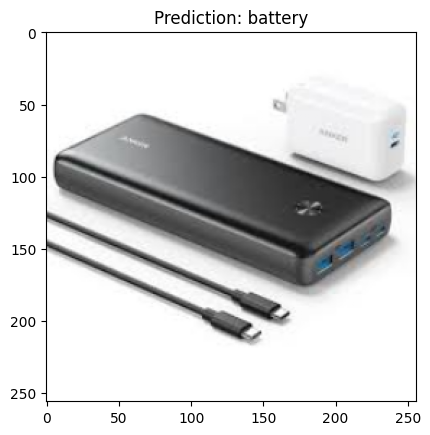

The image /content/garbage_classification/battery/battery755.jpg resembles battery.


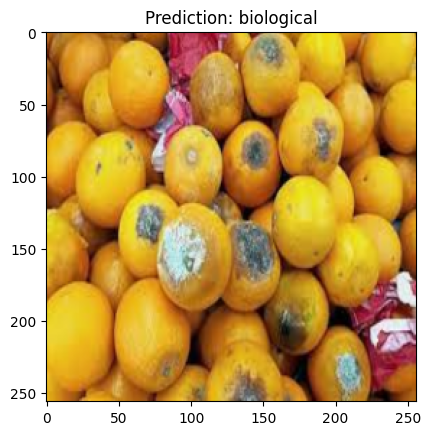

The image /content/garbage_classification/biological/biological358.jpg resembles biological.


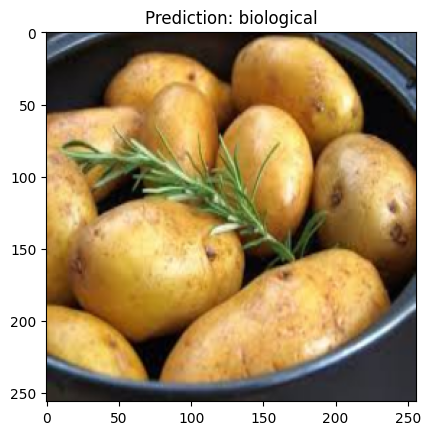

The image /content/garbage_classification/biological/biological8.jpg resembles biological.


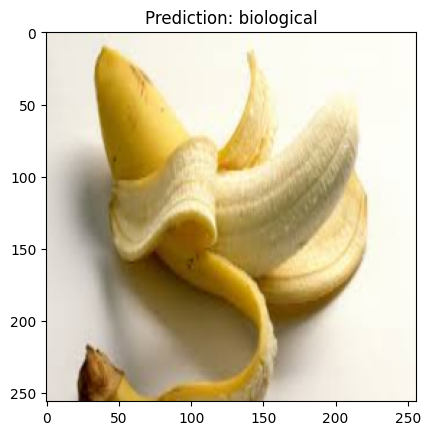

The image /content/garbage_classification/biological/biological242.jpg resembles biological.


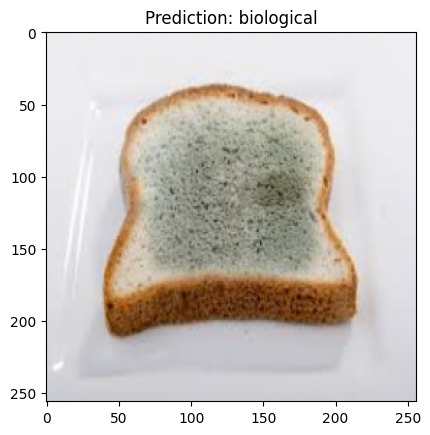

The image /content/garbage_classification/biological/biological106.jpg resembles biological.


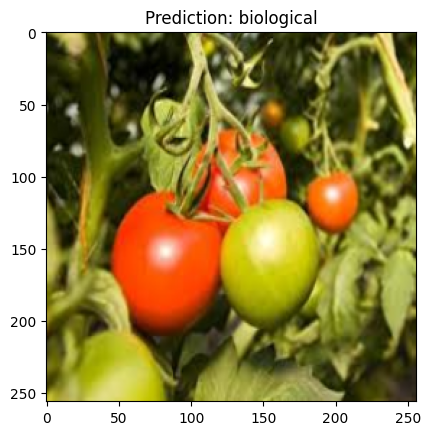

The image /content/garbage_classification/biological/biological916.jpg resembles biological.


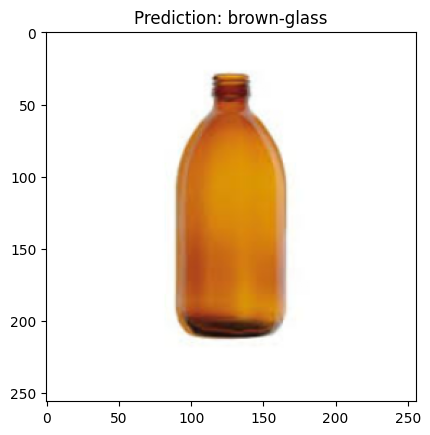

The image /content/garbage_classification/brown-glass/brown-glass567.jpg resembles brown-glass.


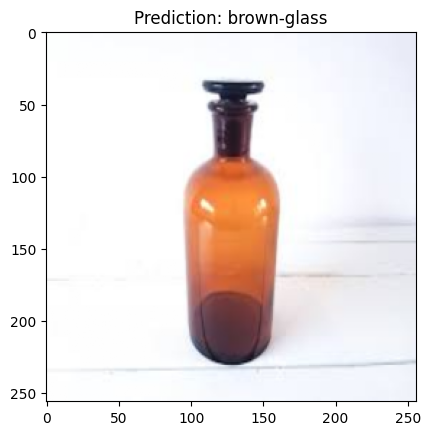

The image /content/garbage_classification/brown-glass/brown-glass369.jpg resembles brown-glass.


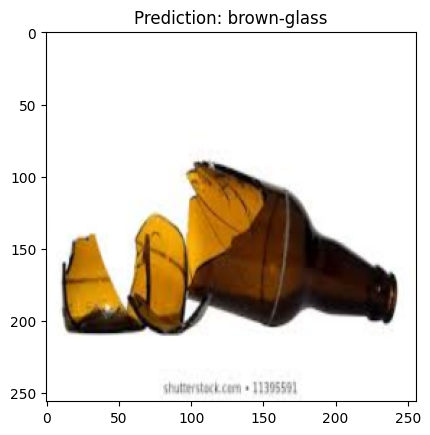

The image /content/garbage_classification/brown-glass/brown-glass513.jpg resembles brown-glass.


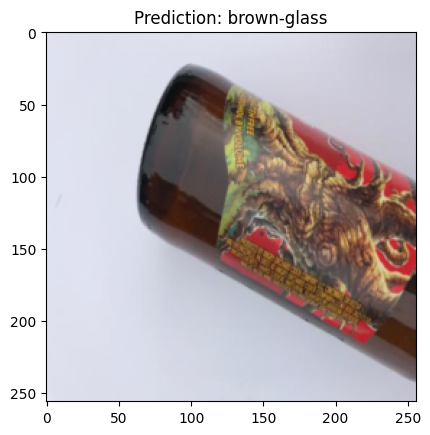

The image /content/garbage_classification/brown-glass/brown-glass242.jpg resembles brown-glass.


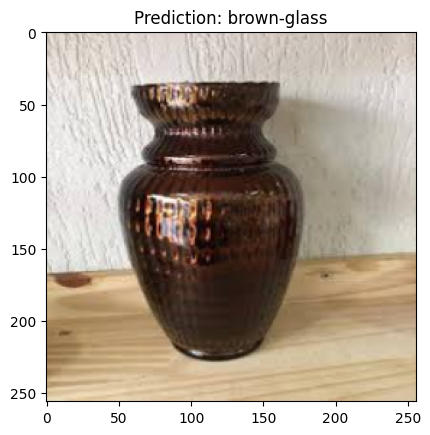

The image /content/garbage_classification/brown-glass/brown-glass510.jpg resembles brown-glass.


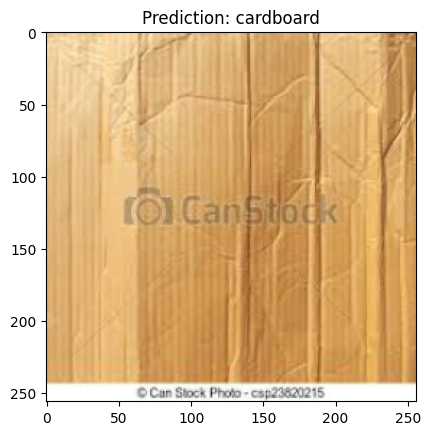

The image /content/garbage_classification/cardboard/cardboard732.jpg resembles cardboard.


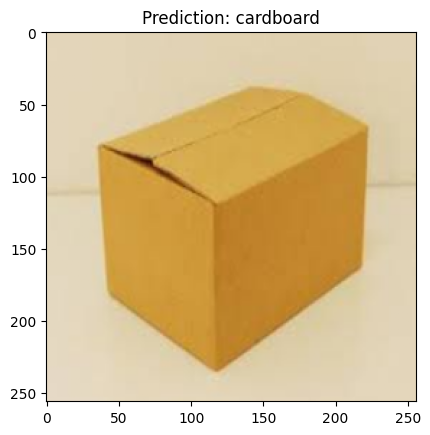

The image /content/garbage_classification/cardboard/cardboard703.jpg resembles cardboard.


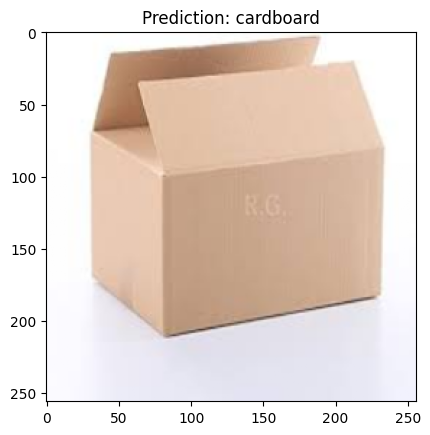

The image /content/garbage_classification/cardboard/cardboard542.jpg resembles cardboard.


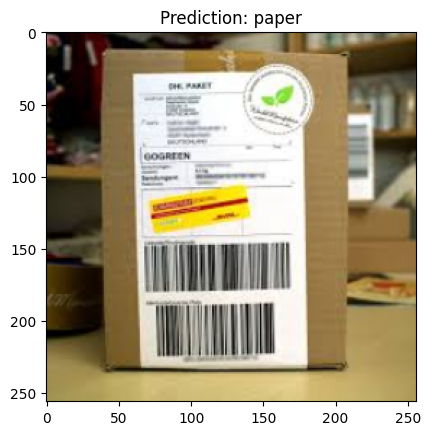

The image /content/garbage_classification/cardboard/cardboard835.jpg resembles paper.


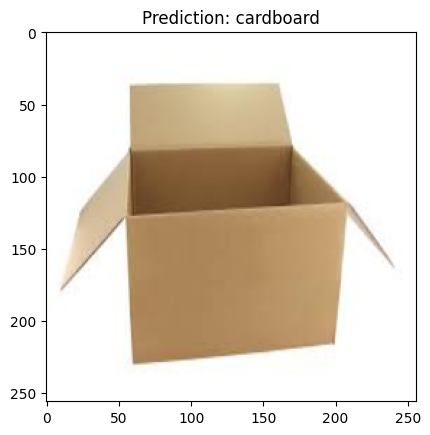

The image /content/garbage_classification/cardboard/cardboard618.jpg resembles cardboard.


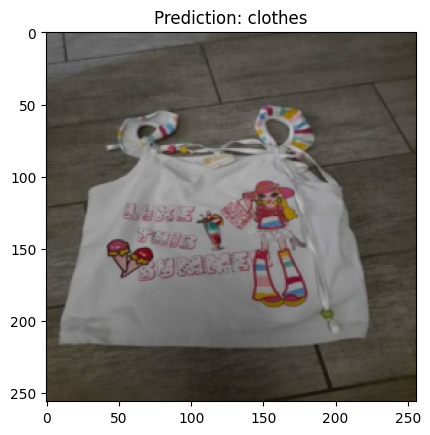

The image /content/garbage_classification/clothes/clothes864.jpg resembles clothes.


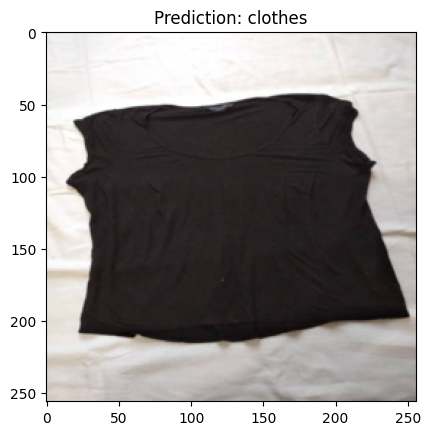

The image /content/garbage_classification/clothes/clothes5003.jpg resembles clothes.


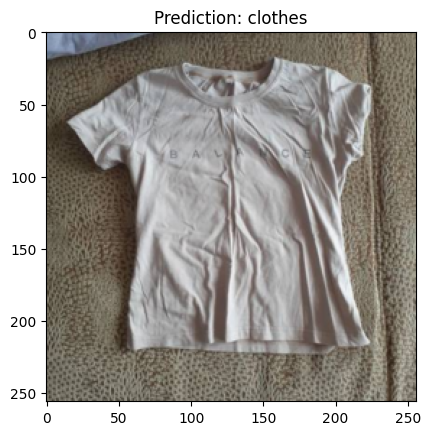

The image /content/garbage_classification/clothes/clothes1114.jpg resembles clothes.


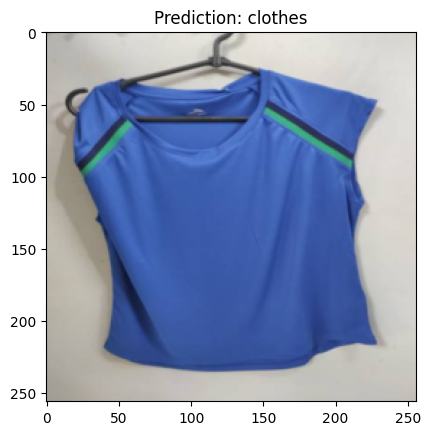

The image /content/garbage_classification/clothes/clothes284.jpg resembles clothes.


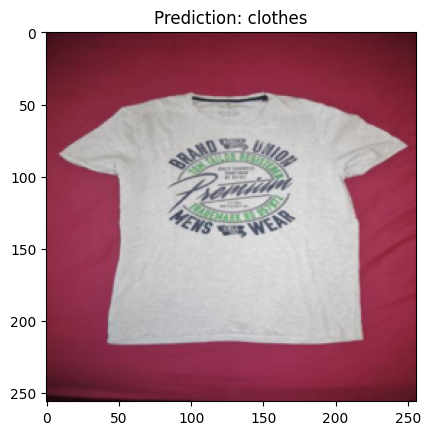

The image /content/garbage_classification/clothes/clothes4360.jpg resembles clothes.


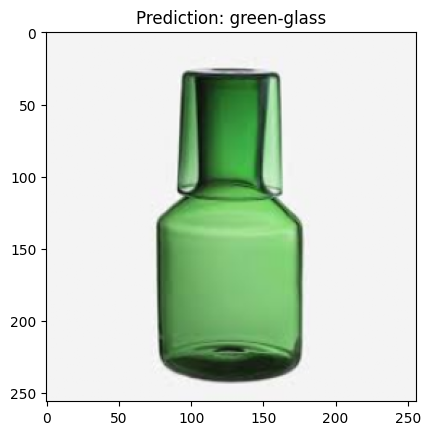

The image /content/garbage_classification/green-glass/green-glass598.jpg resembles green-glass.


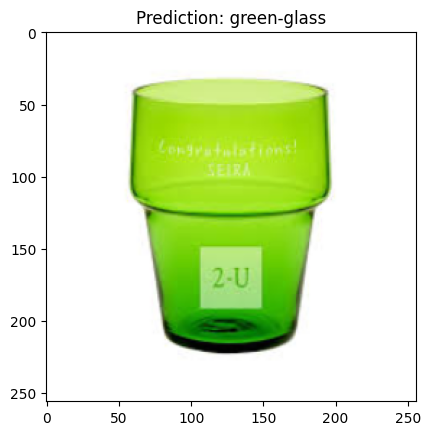

The image /content/garbage_classification/green-glass/green-glass124.jpg resembles green-glass.


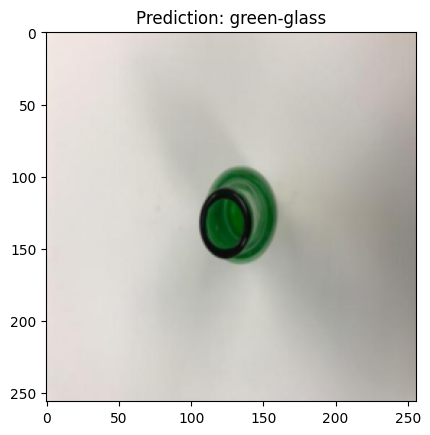

The image /content/garbage_classification/green-glass/green-glass247.jpg resembles green-glass.


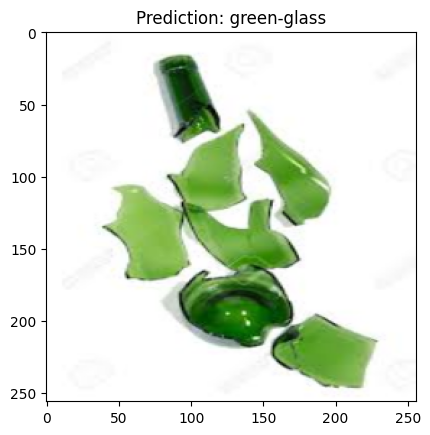

The image /content/garbage_classification/green-glass/green-glass123.jpg resembles green-glass.


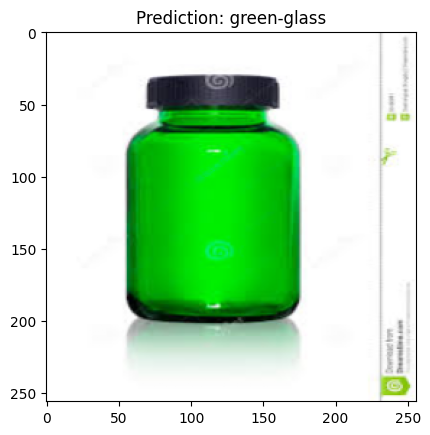

The image /content/garbage_classification/green-glass/green-glass45.jpg resembles green-glass.


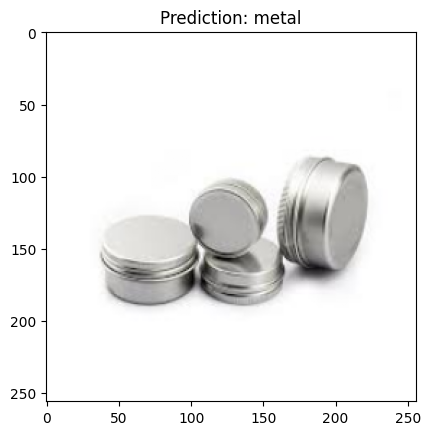

The image /content/garbage_classification/metal/metal686.jpg resembles metal.


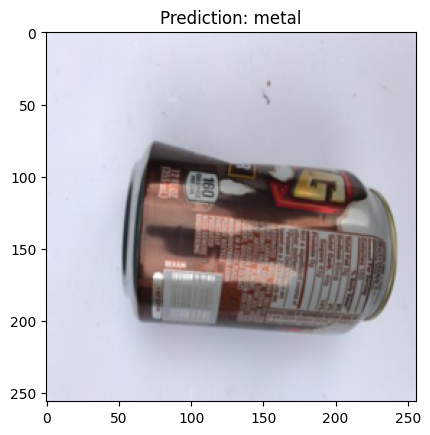

The image /content/garbage_classification/metal/metal343.jpg resembles metal.


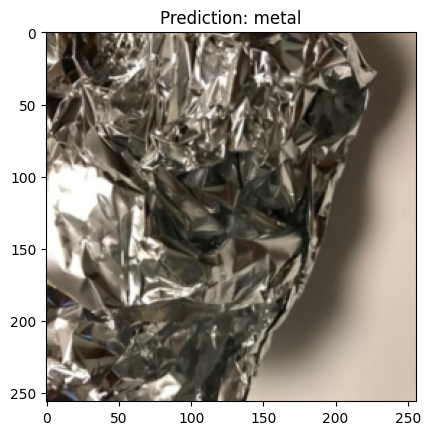

The image /content/garbage_classification/metal/metal440.jpg resembles metal.


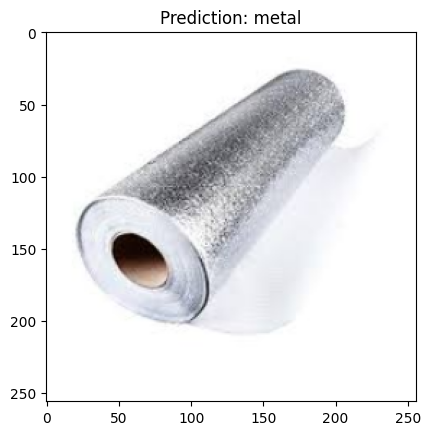

The image /content/garbage_classification/metal/metal445.jpg resembles metal.


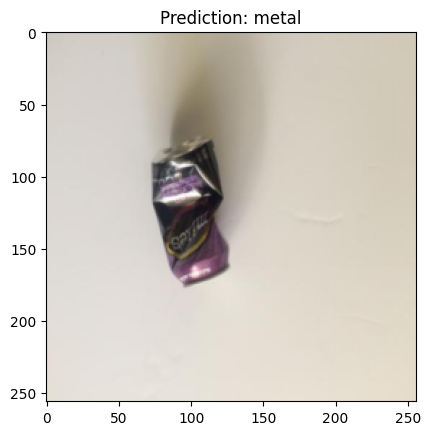

The image /content/garbage_classification/metal/metal443.jpg resembles metal.


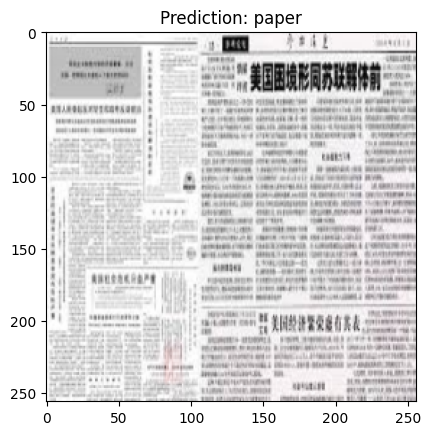

The image /content/garbage_classification/paper/paper200.jpg resembles paper.


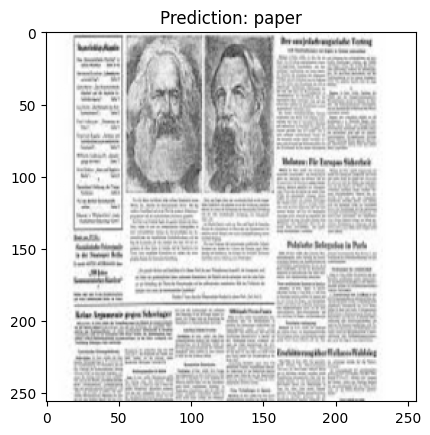

The image /content/garbage_classification/paper/paper235.jpg resembles paper.


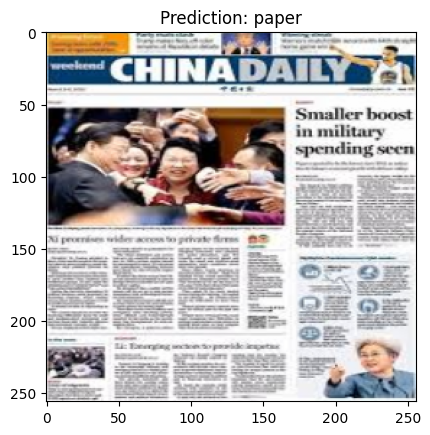

The image /content/garbage_classification/paper/paper185.jpg resembles paper.


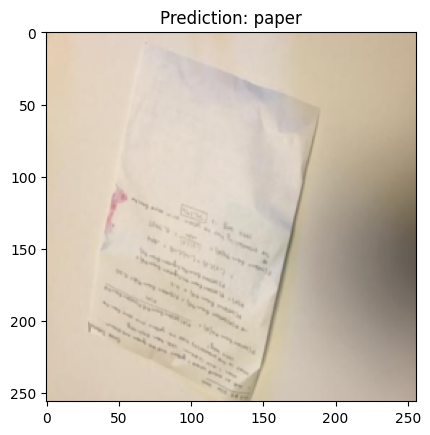

The image /content/garbage_classification/paper/paper35.jpg resembles paper.


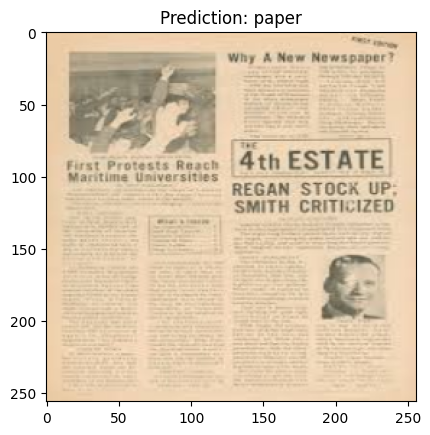

The image /content/garbage_classification/paper/paper267.jpg resembles paper.


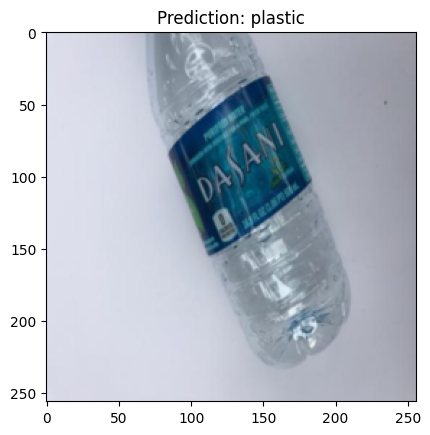

The image /content/garbage_classification/plastic/plastic228.jpg resembles plastic.


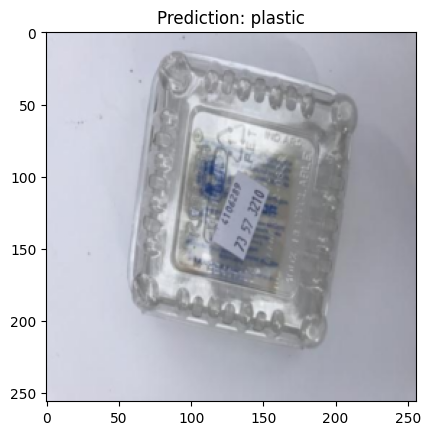

The image /content/garbage_classification/plastic/plastic384.jpg resembles plastic.


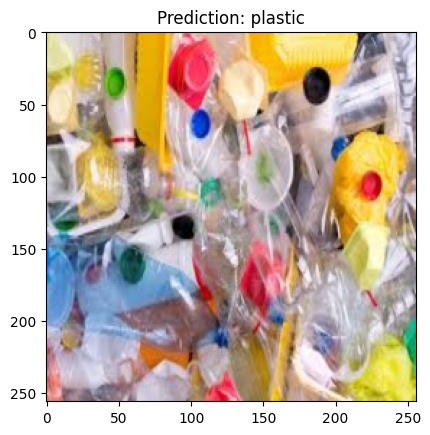

The image /content/garbage_classification/plastic/plastic665.jpg resembles plastic.


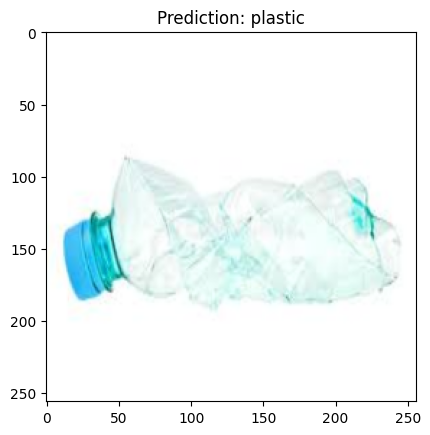

The image /content/garbage_classification/plastic/plastic764.jpg resembles plastic.


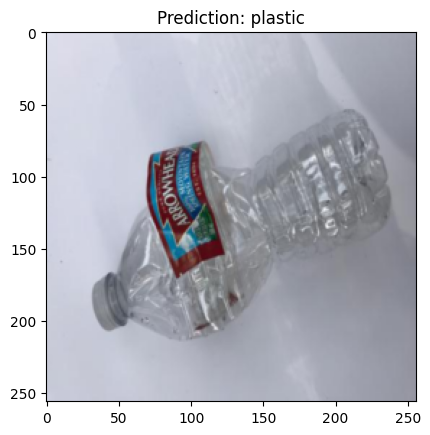

The image /content/garbage_classification/plastic/plastic421.jpg resembles plastic.


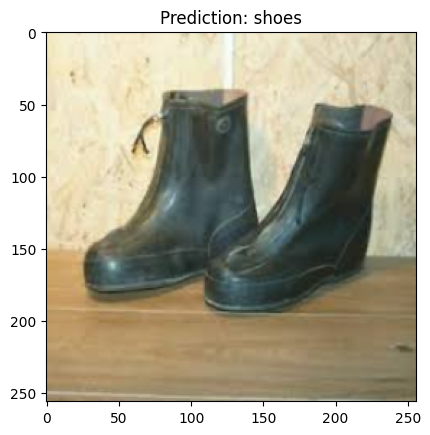

The image /content/garbage_classification/shoes/shoes501.jpg resembles shoes.


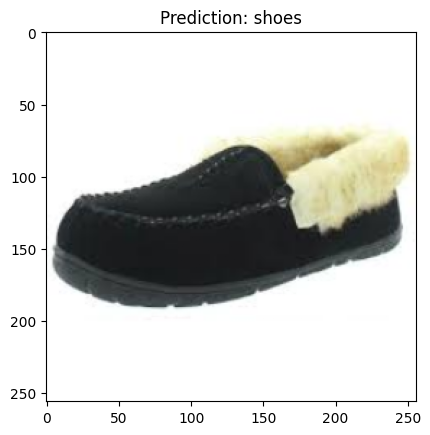

The image /content/garbage_classification/shoes/shoes172.jpg resembles shoes.


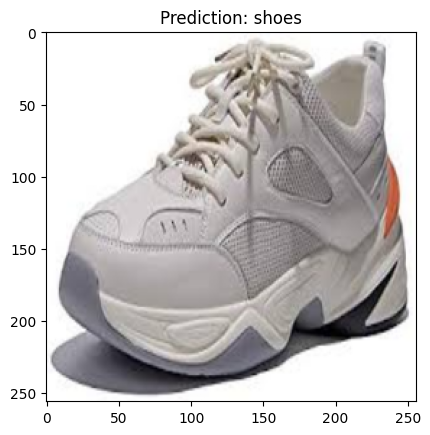

The image /content/garbage_classification/shoes/shoes1092.jpg resembles shoes.


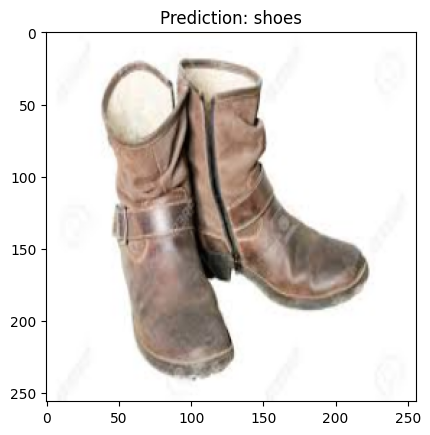

The image /content/garbage_classification/shoes/shoes1281.jpg resembles shoes.


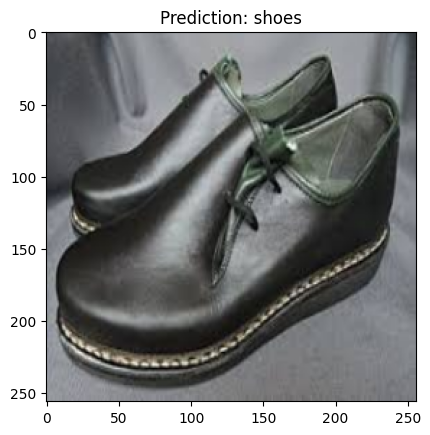

The image /content/garbage_classification/shoes/shoes1038.jpg resembles shoes.


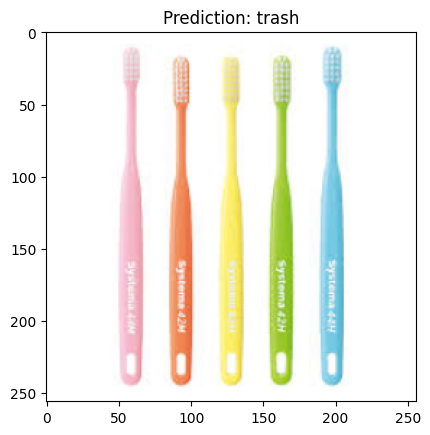

The image /content/garbage_classification/trash/trash626.jpg resembles trash.


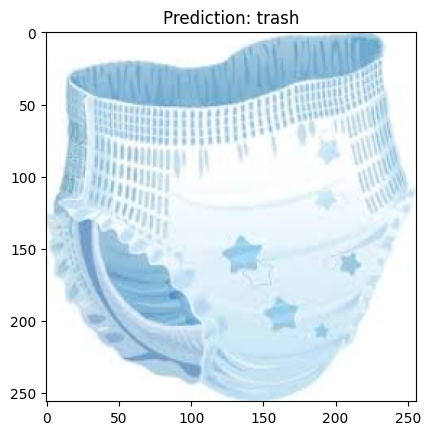

The image /content/garbage_classification/trash/trash188.jpg resembles trash.


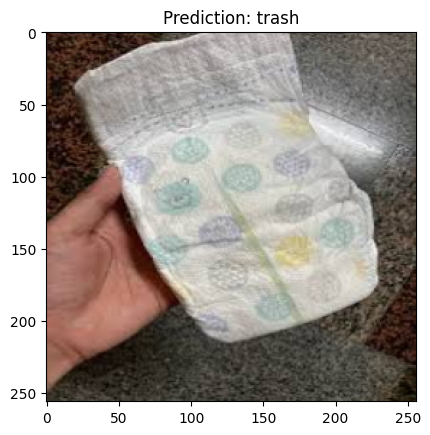

The image /content/garbage_classification/trash/trash22.jpg resembles trash.


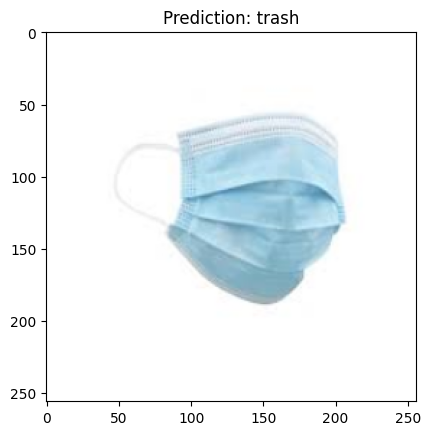

The image /content/garbage_classification/trash/trash306.jpg resembles trash.


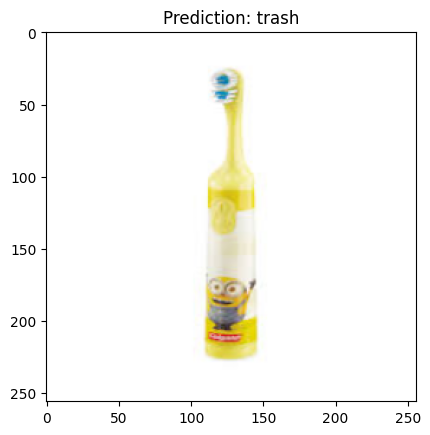

The image /content/garbage_classification/trash/trash529.jpg resembles trash.


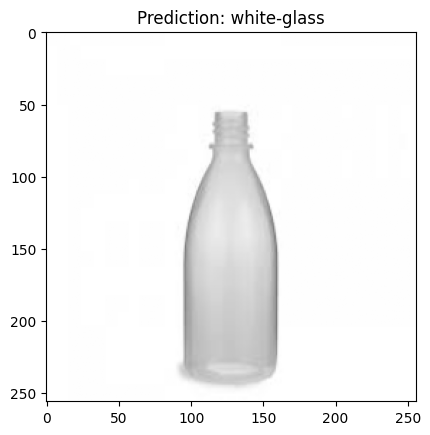

The image /content/garbage_classification/white-glass/white-glass410.jpg resembles white-glass.


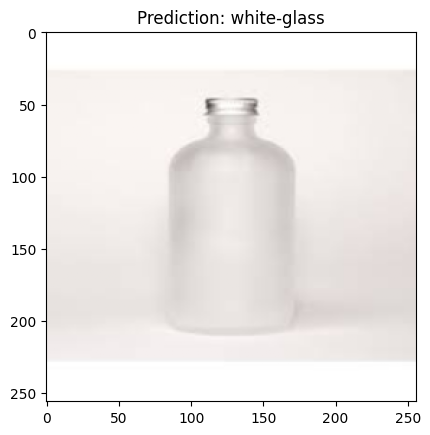

The image /content/garbage_classification/white-glass/white-glass249.jpg resembles white-glass.


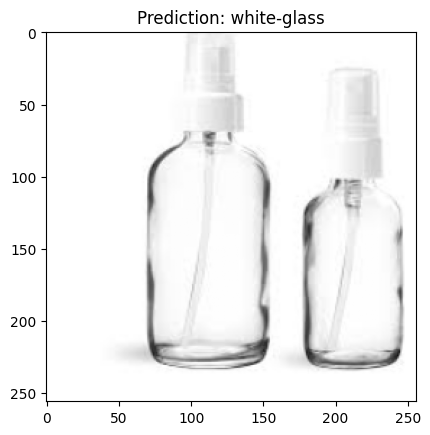

The image /content/garbage_classification/white-glass/white-glass389.jpg resembles white-glass.


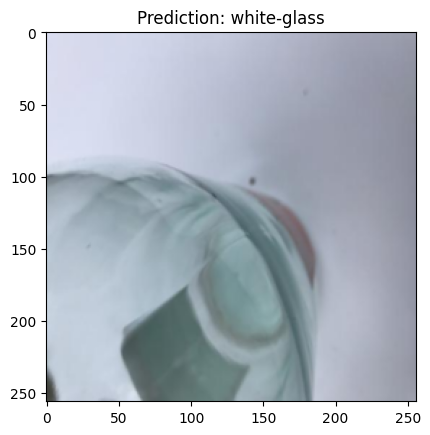

The image /content/garbage_classification/white-glass/white-glass66.jpg resembles white-glass.


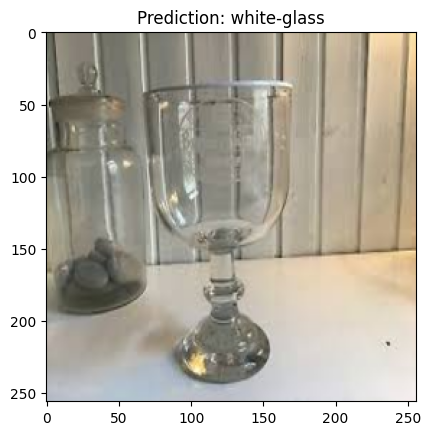

The image /content/garbage_classification/white-glass/white-glass600.jpg resembles white-glass.


In [ ]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

def predict_image(img, model):
    xb = to_device(img.unsqueeze(0), device)
    yb = model(xb)
    prob, preds = torch.max(yb, dim=1)
    return dataset.classes[preds[0].item()]

def predict_images_from_each_folder(base_dir, folders, model, num_images=5):
    for folder in folders:
        folder_path = os.path.join(base_dir, folder)
        image_paths = list(Path(folder_path).glob('*.jpg'))  # Ajusta la extensión de archivo si es necesario
        image_paths = image_paths[:num_images]  # Limitar a num_images

        for image_path in image_paths:
            image = Image.open(image_path)
            example_image = transformations(image)
            plt.imshow(example_image.permute(1, 2, 0))
            plt.title(f"Prediction: {predict_image(example_image, model)}")
            plt.show()
            print(f"The image {image_path} resembles", predict_image(example_image, model) + ".")

# Carpetas a predecir
folders = ['battery', 'biological', 'brown-glass', 'cardboard', 'clothes', 'green-glass', 'metal', 'paper', 'plastic', 'shoes', 'trash', 'white-glass']

# Ruta base de las carpetas
base_dir = data_dir

# Realizar predicciones
predict_images_from_each_folder(base_dir, folders, model)


# **4.4 Fase transformación del tipo de archivo del modelo para compatibilidad**

In [ ]:
!pip uninstall torch torchvision torchaudio
!pip install torch torchvision torchaudio

Found existing installation: torch 2.3.1+cu121
Uninstalling torch-2.3.1+cu121:
  Would remove:
    /usr/local/bin/convert-caffe2-to-onnx
    /usr/local/bin/convert-onnx-to-caffe2
    /usr/local/bin/torchrun
    /usr/local/lib/python3.10/dist-packages/functorch/*
    /usr/local/lib/python3.10/dist-packages/torch-2.3.1+cu121.dist-info/*
    /usr/local/lib/python3.10/dist-packages/torch/*
    /usr/local/lib/python3.10/dist-packages/torchgen/*
Proceed (Y/n)? y
Y
  Successfully uninstalled torch-2.3.1+cu121
Found existing installation: torchvision 0.18.1+cu121
Uninstalling torchvision-0.18.1+cu121:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/torchvision-0.18.1+cu121.dist-info/*
    /usr/local/lib/python3.10/dist-packages/torchvision.libs/libcudart.7ec1eba6.so.12
    /usr/local/lib/python3.10/dist-packages/torchvision.libs/libjpeg.ceea7512.so.62
    /usr/local/lib/python3.10/dist-packages/torchvision.libs/libnvjpeg.f00ca762.so.12
    /usr/local/lib/python3.10/dist-packages/to

In [ ]:
!pip install onnx

In [ ]:
import torch
import torchvision.models as models
import collections
import torch.nn as nn

# Cargar el modelo entrenado con el número correcto de clases
# num_classes = 6 # Reemplaza con el número de clases en tu dataset
num_classes = 12 # The original model was trained on 12 classes

model = models.resnet50(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Cargar el state_dict guardado
state_dict = torch.load('/content/resnet50_garbage_classification.pth')

# Eliminar el prefijo 'network.' de las claves del state_dict
new_state_dict = collections.OrderedDict()
for k, v in state_dict.items():
    if k.startswith('network.'):
        name = k[8:]  # Eliminar 'network.' del nombre de la clave
    else:
        name = k
    new_state_dict[name] = v

# Cargar el state_dict modificado en el modelo
model.load_state_dict(new_state_dict)
model.eval()

# Crear una entrada de prueba para la exportación
dummy_input = torch.randn(1, 3, 224, 224)

# Exportar el modelo a ONNX
torch.onnx.export(model, dummy_input, "resnet50_garbage_classification.onnx",
                  input_names=["input"], output_names=["output"])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
<ipython-input-4-8bb255fc64c8>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions

In [ ]:
pip install onnx onnx-tf


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.1/226.1 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 43.7 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.3.0
    Uninstalling typeguard-4.3.0:
      Successfully uninstalled typeguard-4.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.3.1 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.


In [ ]:
import onnx
from onnx_tf.backend import prepare

# Cargar el modelo ONNX
onnx_model = onnx.load("/content/resnet50_garbage_classification.onnx")

# Convertir a TensorFlow
tf_rep = prepare(onnx_model)

# Exportar el modelo a formato de TensorFlow
tf_rep.export_graph("resnet50_garbage_classification")


/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
INFO:absl:Function `__call__` contains input name(s) x, y with unsupported characters which will be renamed to transpose_161_x, add_52_y in the SavedModel.
INFO:absl:Found untraced functions such as gen_tensor_dict while saving (showing 1 of 1). These functions will not be directly callable after loading.
INFO:absl:Writing fingerprint to resnet50_garbage_classification/fingerprint.pb


In [ ]:
pip install tensorflow


In [ ]:
import tensorflow as tf

# Convertir el modelo a TensorFlow Lite
converter = tf.lite.TFLiteConverter.from_saved_model("resnet50_garbage_classification")
tflite_model = converter.convert()

# Guardar el modelo TFLite
with open("resnet50_garbage_classification.tflite", "wb") as f:
    f.write(tflite_model)


In [ ]:
! jupyter nbconvert --to html garbageclassification.ipynb


[NbConvertApp] Converting notebook garbageclassification.ipynb to html
[NbConvertApp] ERROR | Notebook JSON is invalid: Additional properties are not allowed ('metadata' was unexpected)

Failed validating 'additionalProperties' in stream:

On instance['cells'][6]['outputs'][0]:
{'metadata': {'tags': None},
 'name': 'stderr',
 'output_type': 'stream',
 'text': '/usr/local/lib/python3.10/dist-packages/torchvision/models/_util...'}
/usr/local/lib/python3.10/dist-packages/nbconvert/filters/widgetsdatatypefilter.py:71: UserWarning: Your element with mimetype(s) dict_keys(['application/vnd.colab-display-data+json']) is not able to be represented.
  warn(
[NbConvertApp] Writing 10713332 bytes to garbageclassification.html
